#Importing libraries and data


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

In [2]:
train_data = pd.read_csv('/content/churn-bigml-80.csv')
test_data = pd.read_csv('/content/churn-bigml-20.csv')

# Data exploration and pre-processing

In [3]:
train_data

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False


In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

side note:

---- 19 features and a target column (churn).

---- No missing values in the train_dataset.

---- Churn is a false or true value, then classification problem.

---- we have 4 features with a categorical data type: State, Area code, International plan, Voice mail plan.


In [5]:
train_data.drop(columns= 'Area code').describe()

,Account length,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [6]:
# checking the values of these categorical features
for col in ['State', 'Area code','International plan', 'Voice mail plan']:
    print(f"{col}: {train_data[col].unique()}")

State: ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'WV' 'RI' 'IA' 'MT' 'ID' 'VT' 'VA'
 'TX' 'FL' 'CO' 'AZ' 'NE' 'WY' 'IL' 'NH' 'LA' 'GA' 'AK' 'MD' 'AR' 'WI'
 'OR' 'DE' 'IN' 'UT' 'CA' 'SD' 'NC' 'WA' 'MN' 'NM' 'NV' 'DC' 'NY' 'KY'
 'ME' 'MS' 'MI' 'SC' 'TN' 'PA' 'HI' 'ND' 'CT']
Area code: [415 408 510]
International plan: ['No' 'Yes']
Voice mail plan: ['Yes' 'No']


Side note:

-- These should be encoded:

Internationa plan and voice mail plan are an easy binary encoding

Area code has only 3 unique values with no order meaning, so hot encoding is better than label encoding.

However, State has lots of unique values and if one hot encoded directly, it will result in data sparsity and can lead to high-dimensional data and
may require more computational resources. Other options can be: grouping states into regions thus potentially losing information at the state level.
The question is does state-level differences directly impact churn rates?

In [7]:
def draw_histogram(data,col,plottitle,xlabel,ylabel):
  plt.figure(figsize=(30,10))
  plt.hist(data[col],edgecolor='black')
  plt.title(plottitle)
  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.show()
# function to draw histogram to know the density of any categorical data

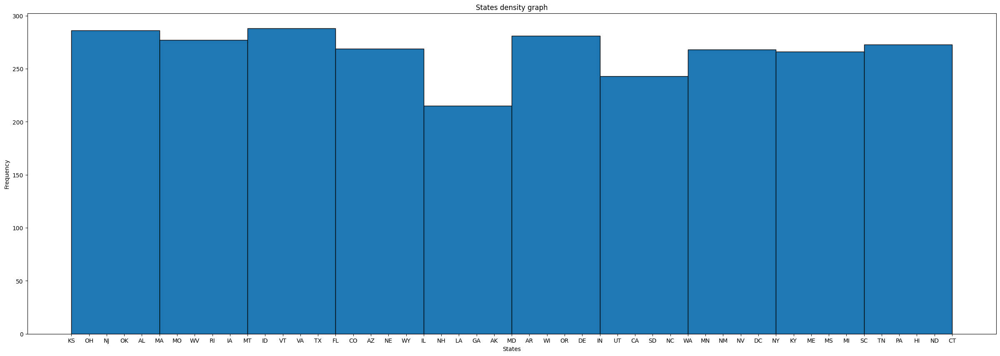

In [8]:
# Draw histogram to know the density of out categorical data: PropertyState
draw_histogram(train_data,'State', 'States density graph', 'States', 'Frequency')

In [9]:
regions = {
    'Northeast': ['ME', 'VT', 'NH', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA'],
    'Midwest': ['OH', 'IN', 'IL', 'MI', 'WI', 'MN', 'IA', 'MO', 'ND', 'SD', 'NE', 'KS'],
    'South': ['DE', 'MD', 'VA', 'WV', 'KY', 'NC', 'SC', 'GA', 'FL', 'AL', 'MS', 'TN', 'AR', 'LA', 'OK', 'TX'],
    'West': ['MT', 'WY', 'CO', 'NM', 'AZ', 'UT', 'NV', 'ID', 'WA', 'OR', 'CA', 'AK', 'HI', 'DC']
}
train_data['Region'] = train_data['State'].map(lambda x: next((k for k, v in regions.items() if x in v), 'Unknown'))
train_data


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,...,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Region
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,...,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Midwest
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,...,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Midwest
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,...,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Northeast
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,...,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Midwest
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,...,12.61,186.9,121,8.41,10.1,3,2.73,3,False,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,...,16.12,221.4,128,9.96,11.8,5,3.19,2,False,South
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,...,18.32,279.1,83,12.56,9.9,6,2.67,2,False,West
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,...,13.04,191.3,123,8.61,9.6,4,2.59,3,False,South
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,...,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Northeast


In [10]:
# One hot encoding
encoded_data = pd.get_dummies(train_data, columns=['Region','Area code'], drop_first=True)
encoded_data = encoded_data.drop(columns=['State'])

# Binary encode 'International plan' and 'Voice mail plan', since it's a yes or a no data
encoded_data['International plan'] = encoded_data['International plan'].map({'No': 0, 'Yes': 1})
encoded_data['Voice mail plan'] = encoded_data['Voice mail plan'].map({'No': 0, 'Yes': 1})
encoded_data


,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,...,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Region_Northeast,Region_South,Region_West,Area code_415,Area code_510
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,...,10.0,3,2.70,1,False,False,False,False,True,False
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,...,13.7,3,3.70,1,False,False,False,False,True,False
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,...,12.2,5,3.29,0,False,True,False,False,True,False
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,...,6.6,7,1.78,2,False,False,False,False,False,False
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,...,10.1,3,2.73,3,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,79,0,0,0,134.7,98,22.90,189.7,68,16.12,...,11.8,5,3.19,2,False,False,True,False,True,False
2662,192,0,1,36,156.2,77,26.55,215.5,126,18.32,...,9.9,6,2.67,2,False,False,False,True,True,False
2663,68,0,0,0,231.1,57,39.29,153.4,55,13.04,...,9.6,4,2.59,3,False,False,True,False,True,False
2664,28,0,0,0,180.8,109,30.74,288.8,58,24.55,...,14.1,6,3.81,2,False,True,False,False,False,True


In [11]:
pip install ydata-profiling

In [12]:
from ydata_profiling import ProfileReport
profile = ProfileReport(encoded_data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From this profile report, the most valuable insights gained are the following:

Alerts

+ Total day charge is highly overall correlated with Total day minutes	High correlation
+ Total eve charge is highly overall correlated with Total eve minutes	High correlation
+ Total intl charge is highly overall correlated with Total intl minutes	High correlation
+ Total night charge is highly overall correlated with Total night minutes	High correlation
+ Voice mail plan is highly overall correlated with Number vmail messages	High correlation
+ International plan is highly imbalanced (52.7%)
+ Number vmail messages has 1933 (72.5%) zeros
+ Customer service calls has 555 (20.8%) zeros

++ This is an **IMBALANCED DATASET** where churn has 2278 = False and only 388 are True (which are essentially what we need to optimize for; less true more false to retain the customers)

++ The target (churn) correlates highly with: customer service calls, International plan, number vmail messages, total day charge, total day minutes features mainly. Correlates less with total eve charge, total eve minutes, total intl calls/charge/minutes, total night charge/minutes and voice mail plan.
Very weak correlation with the regions, area code, total day calls, total eve calls, total night calls.

++ we can also drop highly correlated features such as Total day minutes, Total eve minutes, Total intl minutes and Total night minutes to reduce redundancy.

-------

More insights on feature selection using chi squared scoring

In [13]:
x = encoded_data.drop(columns=(['Churn']))
y= encoded_data['Churn']

In [14]:
# confirm our feature selection using chi squared as the scoring function
from sklearn.feature_selection import chi2, SelectKBest
best_features=SelectKBest(score_func=chi2,k=10)
fit=best_features.fit(x,y)
df_scores= pd.DataFrame(fit.scores_)
df_col=pd.DataFrame(x.columns)
features_score =pd.concat([df_col,df_scores], axis=1)
features_score.columns=['feature','score']
features_score.sort_values(by=['score'],ascending=False)

,feature,score
4,Total day minutes,1670.974104
3,Number vmail messages,460.322168
6,Total day charge,284.061945
1,International plan,184.492057
7,Total eve minutes,183.515789
16,Customer service calls,120.347409
10,Total night minutes,38.655897
2,Voice mail plan,19.056720
14,Total intl calls,17.575117
9,Total eve charge,15.592947


Thus proving more that States or regions/ area code/ total number of calls are less important features as relevance to our target.

Feature engineering

In [15]:
train_data_clean = train_data.drop(columns = ['State','Account length','Area code','Total day calls','Total day minutes','Total eve calls','Total eve minutes','Total night calls','Total night minutes','Total intl minutes','Region'])

# Binary encode 'International plan' and 'Voice mail plan', since it's a yes or a no data
train_data_clean['International plan'] = train_data_clean['International plan'].map({'No': 0, 'Yes': 1})
train_data_clean['Voice mail plan'] = train_data_clean['Voice mail plan'].map({'No': 0, 'Yes': 1})

train_data_clean

,International plan,Voice mail plan,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,0,1,25,45.07,16.78,11.01,3,2.70,1,False
1,0,1,26,27.47,16.62,11.45,3,3.70,1,False
2,0,0,0,41.38,10.30,7.32,5,3.29,0,False
3,1,0,0,50.90,5.26,8.86,7,1.78,2,False
4,1,0,0,28.34,12.61,8.41,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...
2661,0,0,0,22.90,16.12,9.96,5,3.19,2,False
2662,0,1,36,26.55,18.32,12.56,6,2.67,2,False
2663,0,0,0,39.29,13.04,8.61,4,2.59,3,False
2664,0,0,0,30.74,24.55,8.64,6,3.81,2,False


Next is handling outliers

In [16]:
train_data_clean.describe()

,International plan,Voice mail plan,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,0.101275,0.274944,8.021755,30.512404,17.033072,9.052689,4.467367,2.764490,1.562641
std,0.301750,0.446570,13.612277,9.215733,4.330864,2.285120,2.456195,0.752812,1.311236
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.970000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,24.380000,14.050000,7.512500,3.000000,2.300000,1.000000
50%,0.000000,0.000000,0.000000,30.590000,17.080000,9.050000,4.000000,2.750000,1.000000
75%,0.000000,1.000000,19.000000,36.700000,19.980000,10.640000,6.000000,3.270000,2.000000
max,1.000000,1.000000,50.000000,59.640000,30.910000,17.770000,20.000000,5.400000,9.000000


When it comes to handling outliers we must be careful so that we don't remove or replace valuable data when it actually give insights.

From the above statistical description of our feature engineered data, we can declare that total day minutes,total day charge, total eve minutes,total eve charge, total night minutes, total night charge, total intl minutes, total intl charge are all reasonable, the variation from the Q3 to the maximum is not huge and signifies heavy users which could be insighful.

The shoot between the third quartile to the maximum occured in total intl calls where the max is 20 and Q3 is 6 which needs further investigation because even if the range is small, outliers might exist and "could" distort the model (will be reviewed).

There is also a shoot in the number of customer service calls where Q3 is 2 and the maximum is 9, however, users making many calls to customer service could indicate dissatisfaction and as we so this feature highly correlated with the target so outliers will be kept because they provide valuable insight

Lastly, there is also a shoot in the number of vmail messages where the max is 50, while the mean is 8 which suggest that outliers exist and needs further investigation although they might just be users who frequently use voicemail (will be reviewed)

 Identify, handle and verify outliers

In [17]:
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)  # 25th percentile
    Q3 = data[column].quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter rows with outliers in the specified column
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]

    # Return only the column with outliers and the 'Churn' column
    return outliers[[column, 'Churn']]

In [18]:
outliers_1 = detect_outliers_iqr(train_data_clean, 'Number vmail messages')
print(outliers_1)
outliers_2 = detect_outliers_iqr(train_data_clean, 'Total intl calls')
print(outliers_2)

      Number vmail messages  Churn
2188                     50  False
2323                     50  False
      Total intl calls  Churn
19                  19  False
35                  15   True
125                 11  False
148                 12  False
151                 13  False
...                ...    ...
2497                13  False
2512                11  False
2570                13  False
2631                20   True
2646                17  False

[66 rows x 2 columns]


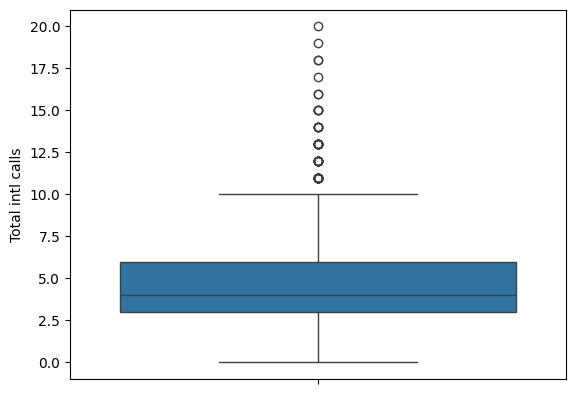

In [19]:
#verify outliers
sns.boxplot(data=train_data_clean['Total intl calls'])
plt.show()

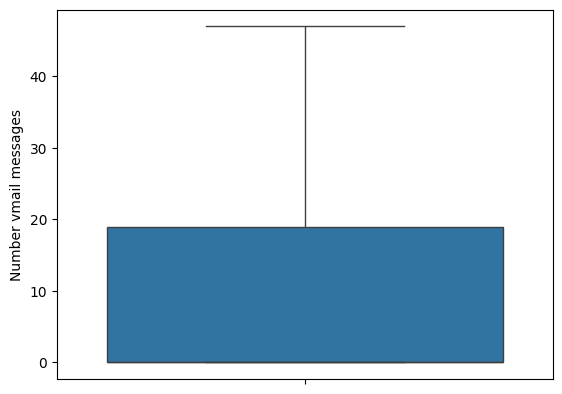

In [20]:
# for Number vmail messages, since there are only 2 outliers with the same churn value of false which is already part of the imbalanced dataset they will be assumed wrong and thus removed
train_data_clean = train_data_clean[~train_data_clean['Number vmail messages'].isin([50])]

#verify the removal of the outlier
sns.boxplot(data=train_data_clean['Number vmail messages'])
plt.show()

As for outliers in Total intl calls a total of 66 rows identified with both true and false churn values present indicating data maight have valuable informarion and so I won't handle it. However if we would want to handle them a better option than removal would probably be winsorization.

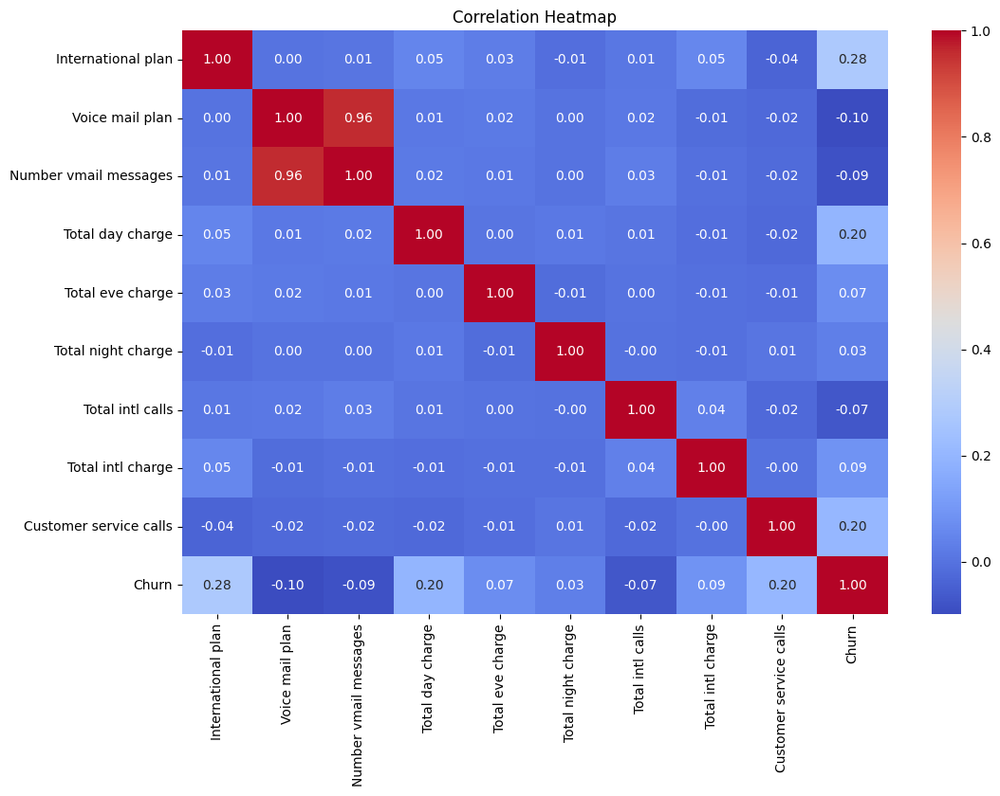

In [21]:
correlation_matrix = train_data_clean.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True)
plt.title("Correlation Heatmap")
plt.show()

Visualizing relationships between Key feature and target

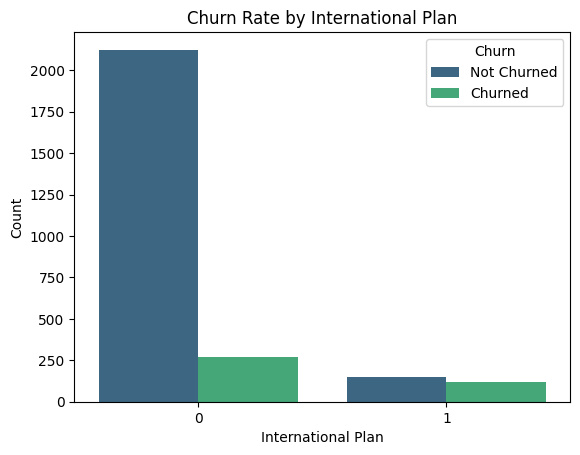

In [22]:
# Bar plot for 'International plan'
sns.countplot(data=train_data_clean, x='International plan', hue='Churn', palette='viridis')
plt.title('Churn Rate by International Plan')
plt.xlabel('International Plan')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right', labels=['Not Churned', 'Churned'])
plt.show()

Insight: The ratio of churn/not churned of the customers with international plans is way higher. Indicating that international plan could be a significant factor.

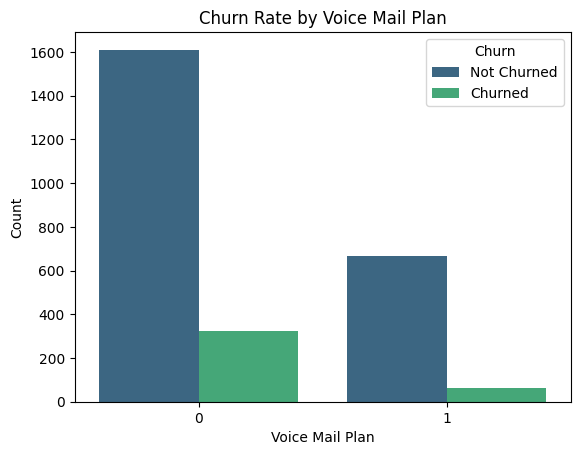

In [23]:
# Bar plot for 'Voice mail plan'
sns.countplot(data=train_data_clean, x='Voice mail plan', hue='Churn', palette='viridis')
plt.title('Churn Rate by Voice Mail Plan')
plt.xlabel('Voice Mail Plan')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right', labels=['Not Churned', 'Churned'])
plt.show()

Insight: Customers without a Voice Mail Plan have a higher churn rate compared to those with a Voice Mail Plan.

Conclusion: Customers with an International Plan and those without a Voice Mail Plan are high-risk groups and should be prioritized in retention efforts

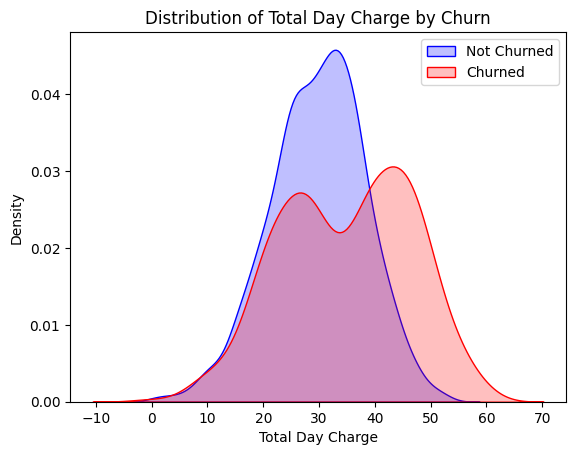

In [24]:
# KDE plot for 'Total day charge'
sns.kdeplot(data=train_data_clean[train_data_clean['Churn'] == False]['Total day charge'], label='Not Churned', fill=True, color='blue')
sns.kdeplot(data=train_data_clean[train_data_clean['Churn'] == True]['Total day charge'], label='Churned', fill=True, color='red')
plt.title('Distribution of Total Day Charge by Churn')
plt.xlabel('Total Day Charge')
plt.ylabel('Density')
plt.legend()
plt.show()

Insight: Churned customers tend to have higher total day charges compared to non-churned customers. (better deals or plans could be offered for higher usage)

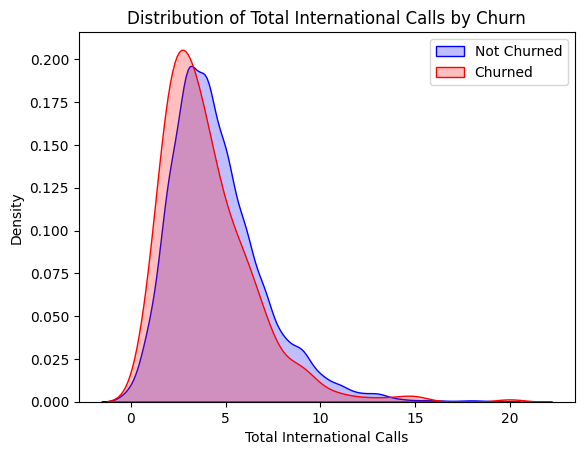

In [25]:
# KDE plot for 'Total intl calls'
sns.kdeplot(data=train_data_clean[train_data_clean['Churn'] == False]['Total intl calls'], label='Not Churned', fill=True, color='blue')
sns.kdeplot(data=train_data_clean[train_data_clean['Churn'] == True]['Total intl calls'], label='Churned', fill=True, color='red')
plt.title('Distribution of Total International Calls by Churn')
plt.xlabel('Total International Calls')
plt.ylabel('Density')
plt.legend()
plt.show()

It could be that higher charges for international calls are driving more churning. (discounts or better plans might reduce churn)

<ipython-input-26-761ee2b6d6c1>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data_clean, x='Churn', y='Customer service calls', palette='rocket')


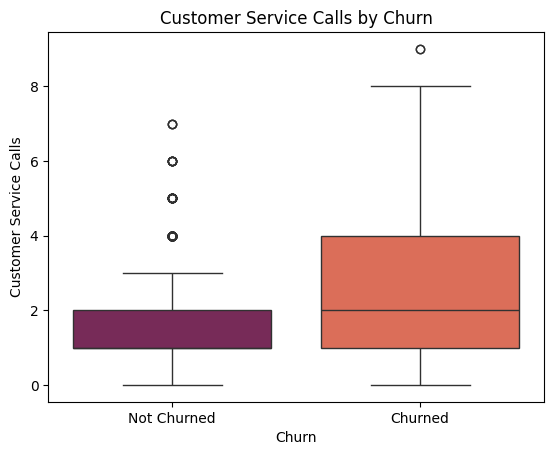

In [26]:
sns.boxplot(data=train_data_clean, x='Churn', y='Customer service calls', palette='rocket')
plt.title('Customer Service Calls by Churn')
plt.xlabel('Churn')
plt.ylabel('Customer Service Calls')
plt.xticks([0, 1], ['Not Churned', 'Churned'])
plt.show()

Insight: Customers who churned tend to have more customer service calls on average compared to those who did not churn.

This tells us to focus on customers with high customer service call as they're more likely to churn

In [27]:
# Separate features and target variable
X_train = train_data_clean.drop('Churn', axis=1)  # Features
y_train = train_data_clean['Churn']  # Target

In [28]:
test_data.shape

(667, 20)

In [29]:
test_data_clean = test_data.drop(columns = ['State','Account length','Area code','Total day calls','Total day minutes','Total eve calls','Total eve minutes','Total night calls','Total night minutes','Total intl minutes'])

# Binary encode 'International plan' and 'Voice mail plan', since it's a yes or a no data
test_data_clean['International plan'] = test_data_clean['International plan'].map({'No': 0, 'Yes': 1})
test_data_clean['Voice mail plan'] = test_data_clean['Voice mail plan'].map({'No': 0, 'Yes': 1})

test_data_clean

,International plan,Voice mail plan,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,0,0,0,31.37,29.89,9.71,4,2.35,1,False
1,0,0,0,21.95,19.42,9.40,6,3.43,4,True
2,0,0,0,56.59,27.01,7.23,9,1.46,4,True
3,0,0,0,18.77,11.67,8.53,6,2.08,2,False
4,0,0,0,20.28,18.28,8.04,1,3.00,1,False
...,...,...,...,...,...,...,...,...,...,...
662,0,1,26,23.31,13.23,11.14,7,3.11,2,False
663,0,1,29,14.21,17.33,10.33,3,2.19,1,False
664,0,0,0,32.96,7.23,9.45,8,3.56,3,False
665,0,0,0,28.87,16.80,8.72,4,3.13,1,False


In [30]:
X_test = test_data_clean.drop('Churn', axis=1)  # Features
y_test = test_data_clean['Churn']  # Target

Addressing class imbalance (oversampling using SMOTE technique)

In [31]:
# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [32]:
# Combine the oversampled features and target into a single DataFrame
X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X_train.columns)  # Convert features back to a DataFrame
y_train_resampled_df = pd.DataFrame(y_train_resampled, columns=['Churn'])       # Convert target to DataFrame

# Combine features and target
oversampled_data = pd.concat([X_train_resampled_df, y_train_resampled_df], axis=1)

# Verify the oversampling process
print(oversampled_data['Churn'].value_counts())  # Check the new class distribution
oversampled_data.head()  # View the first few rows of the oversampled data

Churn
False    2276
True     2276
Name: count, dtype: int64


,International plan,Voice mail plan,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,0,1,25,45.07,16.78,11.01,3,2.70,1,False
1,0,1,26,27.47,16.62,11.45,3,3.70,1,False
2,0,0,0,41.38,10.30,7.32,5,3.29,0,False
3,1,0,0,50.90,5.26,8.86,7,1.78,2,False
4,1,0,0,28.34,12.61,8.41,3,2.73,3,False


Data scaling (especially for scale sensitive models)

In [33]:
# The numerical features that needs scaling
numerical_features = ['Number vmail messages', 'Total day charge', 'Total eve charge',
                      'Total night charge', 'Total intl calls', 'Total intl charge',
                      'Customer service calls']

In [34]:
# Scale the data after oversampling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled[numerical_features])  # Fit and transform training set
X_test_scaled = scaler.transform(X_test[numerical_features])  # Transform test set using the same scaler

scaling only the numerical features that requires scaling

In [35]:
# Convert scaled numerical data back into a DataFrame
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numerical_features, index=X_train_resampled.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numerical_features, index=X_test.index)

# Select the categorical features that were not scaled
categorical_features = X_train.drop(columns=numerical_features).columns
X_train_categorical = X_train_resampled[categorical_features]
X_test_categorical = X_test[categorical_features]

# Combine scaled numerical data with categorical data
X_train_combined = pd.concat([X_train_scaled_df, X_train_categorical], axis=1)
X_test_combined = pd.concat([X_test_scaled_df, X_test_categorical], axis=1)

In [36]:
train_data_combined = pd.concat([X_train_combined, y_train_resampled], axis=1)
train_data_combined

,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls,International plan,Voice mail plan,Churn
0,1.413558,1.229068,-0.130013,0.886321,-0.485528,-0.166744,-0.464665,0,1,False
1,1.491216,-0.457003,-0.168652,1.093689,-0.485528,1.261510,-0.464665,0,1,False
2,-0.527894,0.875568,-1.694899,-0.852736,0.372939,0.675926,-1.128972,0,0,False
3,-0.527894,1.787579,-2.912033,-0.126951,1.231406,-1.480736,0.199642,1,0,False
4,-0.527894,-0.373658,-1.137046,-0.339031,-0.485528,-0.123896,0.863950,1,0,False
...,...,...,...,...,...,...,...,...,...,...
4547,-0.527894,0.877540,1.281613,-1.083738,-0.914762,0.322165,-0.464665,0,0,True
4548,-0.527894,2.573886,0.244402,1.132495,1.660640,0.080739,-0.464665,0,0,True
4549,-0.527894,0.589949,-0.408708,-0.739484,-1.343995,0.059035,-1.128972,0,0,True
4550,-0.527894,0.608036,1.040719,0.322220,0.372939,-1.193308,0.199642,0,0,True


In [37]:
test_data_combined = pd.concat([X_test_combined, y_test], axis=1)
test_data_combined

,Number vmail messages,Total day charge,Total eve charge,Total night charge,Total intl calls,Total intl charge,Customer service calls,International plan,Voice mail plan,Churn
0,-0.527894,-0.083385,3.035983,0.273645,-0.056294,-0.666632,-0.464665,0,0,False
1,-0.527894,-0.985817,0.507533,0.127545,0.802173,0.875881,1.528257,0,0,True
2,-0.527894,2.332679,2.340478,-0.895153,2.089874,-1.937777,1.528257,0,0,True
3,-0.527894,-1.290459,-1.364052,-0.282476,0.802173,-1.052260,0.199642,0,0,False
4,-0.527894,-1.145802,0.232229,-0.513408,-1.343995,0.261732,-0.464665,0,0,False
...,...,...,...,...,...,...,...,...,...,...
662,1.491216,-0.855529,-0.987320,0.947589,1.231406,0.418840,0.199642,0,1,False
663,1.724190,-1.727305,0.002809,0.565844,-0.485528,-0.895153,-0.464665,0,1,False
664,-0.527894,0.068936,-2.436288,0.151110,1.660640,1.061554,0.863950,0,0,False
665,-0.527894,-0.322884,-0.125183,-0.192931,-0.056294,0.447405,-0.464665,0,0,False


Final dataset where
+ X_train_combined is the dataframe with the scaled, sampled training features data.
+ y_train_resampled_df is the corresponding churn value for these features
+ X_test_combined is the final dataframe for test set after scaling
+ y_test is the corresponding churn value

train_data_combined and test_data_combined

# Model selection and training

First, starting with a simple model to establish a baseline (logistic regression). Our problem is binary classification.

### Logistic Regression

In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
# train the logisitic regressor
logreg = LogisticRegression(random_state=42)  # Initialize the model
logreg.fit(X_train_combined, y_train_resampled)  # Train the model on the training data

# Make predictions on the test set
y_pred = logreg.predict(X_test_combined)
y_pred_proba = logreg.predict_proba(X_test_combined)[:, 1]

# Evaluate the model
accuracy_log = accuracy_score(y_test, y_pred)
precision_log = precision_score(y_test, y_pred)
recall_log = recall_score(y_test, y_pred)
f1_log = f1_score(y_test, y_pred)
roc_auc_log = roc_auc_score(y_test, y_pred_proba)

In [39]:
# Print evaluation metrics
print("Logistic Regression Performance Metrics:")
print(f"Accuracy: {accuracy_log:.2f}")
print(f"Precision: {precision_log:.2f}")
print(f"Recall: {recall_log:.2f}")
print(f"F1-Score: {f1_log:.2f}")
print(f"ROC-AUC: {roc_auc_log:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Logistic Regression Performance Metrics:
Accuracy: 0.70
Precision: 0.29
Recall: 0.77
F1-Score: 0.42
ROC-AUC: 0.80

Classification Report:
              precision    recall  f1-score   support

       False       0.95      0.69      0.80       572
        True       0.29      0.77      0.42        95

    accuracy                           0.70       667
   macro avg       0.62      0.73      0.61       667
weighted avg       0.85      0.70      0.75       667



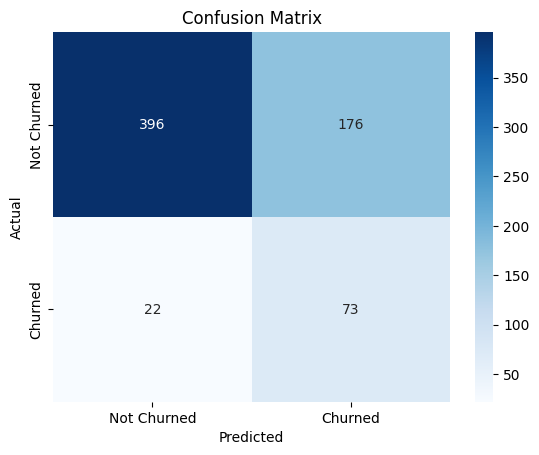

In [40]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Churned", "Churned"], yticklabels=["Not Churned", "Churned"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

### Random Forest

In [41]:
from sklearn.ensemble import RandomForestClassifier

# 1. Initialize the Random Forest model
rf_modell = RandomForestClassifier(n_estimators=100, random_state=42)

# 2. Train the model
rf_modell.fit(X_train_combined, y_train_resampled)

# 3. Make predictions on the test set
y_pred_rf = rf_modell.predict(X_test_combined)
y_pred_proba_rf = rf_modell.predict_proba(X_test_combined)[:, 1]

# 4. Evaluate the model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)

In [42]:
# Print the results
print("Random Forest Performance Metrics:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1-Score: {f1_rf:.2f}")
print(f"ROC-AUC: {roc_auc_rf:.2f}")

# Classification report
print("\nClassification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

Random Forest Performance Metrics:
Accuracy: 0.93
Precision: 0.72
Recall: 0.82
F1-Score: 0.76
ROC-AUC: 0.91

Classification Report for Random Forest:
              precision    recall  f1-score   support

       False       0.97      0.95      0.96       572
        True       0.72      0.82      0.76        95

    accuracy                           0.93       667
   macro avg       0.84      0.88      0.86       667
weighted avg       0.93      0.93      0.93       667



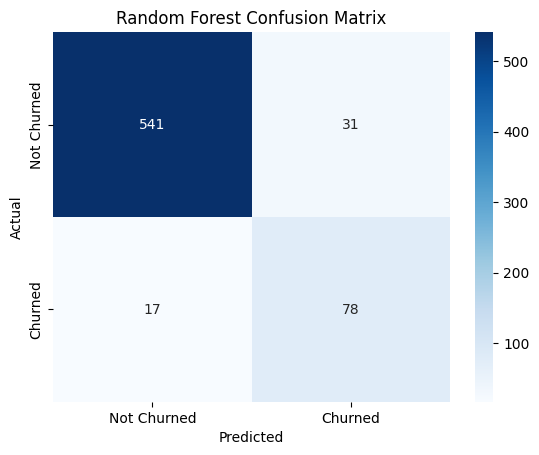

In [43]:
# Confusion matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Churned", "Churned"], yticklabels=["Not Churned", "Churned"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()


### XGBoost

In [44]:
from xgboost import XGBClassifier

# 1. Initialize the XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)

# 2. Train the model
xgb_model.fit(X_train_combined, y_train_resampled)

# 3. Make predictions on the test set
y_pred_xgb = xgb_model.predict(X_test_combined)
y_pred_proba_xgb = xgb_model.predict_proba(X_test_combined)[:, 1]

# 4. Evaluate the model
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
precision_xgb = precision_score(y_test, y_pred_xgb)
recall_xgb = recall_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb)
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:28:47] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [45]:
# Print the results
print("XGBoost Performance Metrics:")
print(f"Accuracy: {accuracy_xgb:.2f}")
print(f"Precision: {precision_xgb:.2f}")
print(f"Recall: {recall_xgb:.2f}")
print(f"F1-Score: {f1_xgb:.2f}")
print(f"ROC-AUC: {roc_auc_xgb:.2f}")

# Classification report
print("\nClassification Report for XGBoost:")
print(classification_report(y_test, y_pred_xgb))


XGBoost Performance Metrics:
Accuracy: 0.93
Precision: 0.70
Recall: 0.82
F1-Score: 0.76
ROC-AUC: 0.91

Classification Report for XGBoost:
              precision    recall  f1-score   support

       False       0.97      0.94      0.96       572
        True       0.70      0.82      0.76        95

    accuracy                           0.93       667
   macro avg       0.84      0.88      0.86       667
weighted avg       0.93      0.93      0.93       667



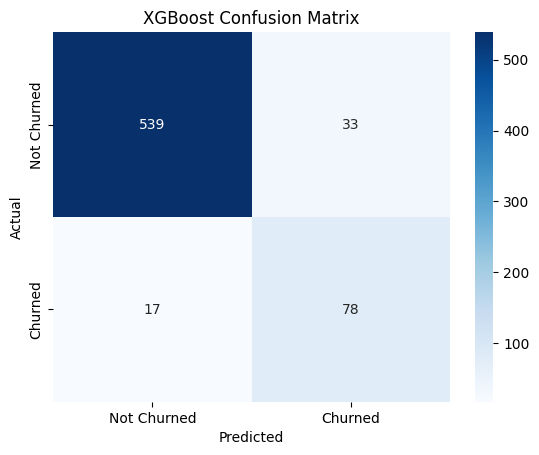

In [46]:
# Confusion matrix
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Churned", "Churned"], yticklabels=["Not Churned", "Churned"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("XGBoost Confusion Matrix")
plt.show()

### SVC

In [47]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

# Initialize the SVM model with hyperparameters
svc_model = SVC(kernel='rbf', C=1.0, class_weight='balanced', random_state=42)

# Fit the model to the training data
svc_model.fit(X_train_combined, y_train_resampled)

# Make predictions on the test data
y_pred = svc_model.predict(X_test_combined)

# Evaluate the model's performance
accuracy_svc = accuracy_score(y_test, y_pred)
f1_svc = f1_score(y_test, y_pred)
precision_svc = precision_score(y_test, y_pred)
recall_svc = recall_score(y_test, y_pred)

In [48]:
# Print evaluation metrics
print("SVC Model Performance:")
print(f"Accuracy: {accuracy_svc:.2f}")
print(f"F1 Score: {f1_svc:.2f}")
print(f"Precision: {precision_svc:.2f}")
print(f"Recall: {recall_svc:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

SVC Model Performance:
Accuracy: 0.90
F1 Score: 0.69
Precision: 0.63
Recall: 0.75

Classification Report:
              precision    recall  f1-score   support

       False       0.96      0.93      0.94       572
        True       0.63      0.75      0.69        95

    accuracy                           0.90       667
   macro avg       0.80      0.84      0.81       667
weighted avg       0.91      0.90      0.91       667



In [49]:
# Create a dictionary with the metrics for all models
model_metrics = {
    "ML mode": ["Logistic Regression", "Random Forest", "XGBoost", "SVC"],
    "Accuracy metric": [accuracy_log, accuracy_rf, accuracy_xgb, accuracy_svc],
    "F1-score metric": [f1_log, f1_rf, f1_xgb, f1_svc],
    "Precision": [precision_log, precision_rf, precision_xgb, precision_svc],
    "Recall": [recall_log, recall_rf, recall_xgb, recall_svc],
}

# Create the DataFrame
metrics_df = pd.DataFrame(model_metrics)

# Display the DataFrame
metrics_df

,ML mode,Accuracy metric,F1-score metric,Precision,Recall
0,Logistic Regression,0.703148,0.424419,0.293173,0.768421
1,Random Forest,0.928036,0.764706,0.715596,0.821053
2,XGBoost,0.925037,0.757282,0.702703,0.821053
3,SVC,0.902549,0.685990,0.633929,0.747368


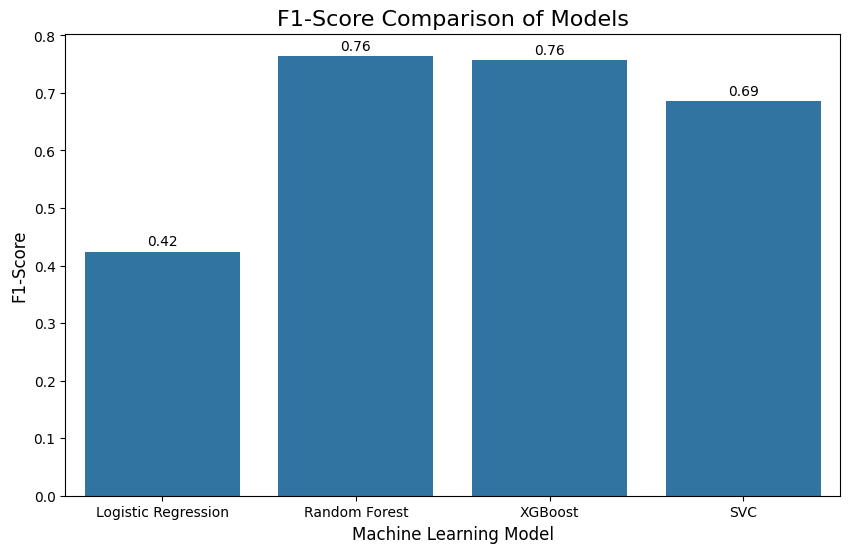

In [50]:
def plot_f1_comparison(df):
    """
    Creates a bar plot comparing F1-scores for different models.
    """
    # Find the best model based on F1-score
    best_model_idx = df['F1-score metric'].idxmax()

    # Plot the F1-scores
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x="ML mode", y="F1-score metric", )

    # Add title and labels
    plt.title("F1-Score Comparison of Models", fontsize=16)
    plt.xlabel("Machine Learning Model", fontsize=12)
    plt.ylabel("F1-Score", fontsize=12)

    # Annotate the F1-scores on the bars
    for i, val in enumerate(df["F1-score metric"]):
        plt.text(i, val + 0.01, f"{val:.2f}", ha="center", fontsize=10)

    # Show the plot
    plt.show()

# Plot F1-Score comparison
plot_f1_comparison(metrics_df)

Random forest model have the same recall as XGBoost but with more precision

Conclusion: Random Forest is the best performing model and thus will be selected

Model training and hyperparameter tuning

In [72]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define the parameter grid for Random Search
param_dist = {
    'n_estimators': randint(100, 500),  # Number of trees
    'max_depth': [None, 10, 20, 30, 40, 50],  # Maximum depth of trees
    'min_samples_split': randint(2, 20),  # Minimum samples to split a node
    'min_samples_leaf': randint(1, 20),  # Minimum samples at each leaf node
    'max_features': ['sqrt', 'log2', None],  # Number of features for best split
    'bootstrap': [True, False],  # Whether to use bootstrap sampling
    'class_weight': [None, 'balanced']  # Adjust for imbalanced classes
}

# Initialize the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=param_dist,
    n_iter=40,  # Number of parameter combinations to try
    scoring='roc_auc',  # Metric to optimize (you can use 'f1', 'recall', etc.)
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    random_state=2025,
    verbose=1
)

# Fit the Random Search on the training data
random_search.fit(X_train_combined, y_train_resampled)

# Get the best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters:", best_params)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'bootstrap': False, 'class_weight': 'balanced', 'max_depth': 50, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 422}


# Model's performance evaluation and interpretation


Evaluate the fine-tuned model

In [73]:
# Make predictions on the test set
y_pred_tuned = best_model.predict(X_test_combined)
y_pred_proba_tuned = best_model.predict_proba(X_test_combined)[:, 1]

# Evaluate the model
accuracy_tuned = accuracy_score(y_test, y_pred_tuned)
precision_tuned = precision_score(y_test, y_pred_tuned)
recall_tuned = recall_score(y_test, y_pred_tuned)
f1_tuned = f1_score(y_test, y_pred_tuned)
roc_auc_tuned = roc_auc_score(y_test, y_pred_proba_tuned)

print("Tuned Random Forest Performance Metrics:")
print(f"Accuracy: {accuracy_tuned:.2f}")
print(f"Precision: {precision_tuned:.2f}")
print(f"Recall: {recall_tuned:.2f}")
print(f"F1-Score: {f1_tuned:.2f}")
print(f"ROC-AUC: {roc_auc_tuned:.2f}")

# Classification Report
print("\nClassification Report for Tuned Random Forest:")
print(classification_report(y_test, y_pred_tuned))

Tuned Random Forest Performance Metrics:
Accuracy: 0.94
Precision: 0.78
Recall: 0.84
F1-Score: 0.81
ROC-AUC: 0.92

Classification Report for Tuned Random Forest:
              precision    recall  f1-score   support

       False       0.97      0.96      0.97       572
        True       0.78      0.84      0.81        95

    accuracy                           0.94       667
   macro avg       0.88      0.90      0.89       667
weighted avg       0.95      0.94      0.95       667



Evaluate the fine tuned model for overfitting

In [74]:
y_pred_train = best_model.predict(X_train_combined)

# Evaluate the model
accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
precision_train = precision_score(y_train_resampled, y_pred_train)
recall_train = recall_score(y_train_resampled, y_pred_train)
f1_train = f1_score(y_train_resampled, y_pred_train)

In [75]:
print("Tuned Random Forest Performance Metrics on train dataset:")
print(f"Accuracy: {accuracy_train:.2f}")
print(f"Precision: {precision_train:.2f}")
print(f"Recall: {recall_train:.2f}")
print(f"F1-Score: {f1_train:.2f}")

print("Tuned Random Forest Performance Metrics on test dataset:")
print(f"Accuracy: {accuracy_tuned:.2f}")
print(f"Precision: {precision_tuned:.2f}")
print(f"Recall: {recall_tuned:.2f}")
print(f"F1-Score: {f1_tuned:.2f}")

Tuned Random Forest Performance Metrics on train dataset:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1-Score: 1.00
Tuned Random Forest Performance Metrics on test dataset:
Accuracy: 0.94
Precision: 0.78
Recall: 0.84
F1-Score: 0.81


A decrease between the scores of the train dataset and the test dataset imply the existence of an overfitting

In [76]:
# Testing the random forrest on the churn 20 data
y_pred_rf_20 = rf_modell.predict(X_test_combined)
y_pred_proba_rf_20 = rf_modell.predict_proba(X_test_combined)[:, 1]

# Evaluation metrics
accuracy_rf_20 = accuracy_score(y_test, y_pred_rf_20)
precision_rf_20 = precision_score(y_test, y_pred_rf_20)
recall_rf_20 = recall_score(y_test, y_pred_rf_20)
f1_rf_20 = f1_score(y_test, y_pred_rf_20)
roc_auc_rf_20 = roc_auc_score(y_test, y_pred_proba_rf_20)

# Print the results
print("Random Forest Performance Metrics before fine tuning:")
print(f"Accuracy: {accuracy_rf_20:.2f}")
print(f"Precision: {precision_rf_20:.2f}")
print(f"Recall: {recall_rf_20:.2f}")
print(f"F1-Score: {f1_rf_20:.2f}")

# Classification report
print("\nClassification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf_20))

print("Random Forest Performance Metrics after fine tuning:")
print(f"Accuracy: {accuracy_tuned:.2f}")
print(f"Precision: {precision_tuned:.2f}")
print(f"Recall: {recall_tuned:.2f}")
print(f"F1-Score: {f1_tuned:.2f}")

Random Forest Performance Metrics before fine tuning:
Accuracy: 0.93
Precision: 0.72
Recall: 0.82
F1-Score: 0.76

Classification Report for Random Forest:
              precision    recall  f1-score   support

       False       0.97      0.95      0.96       572
        True       0.72      0.82      0.76        95

    accuracy                           0.93       667
   macro avg       0.84      0.88      0.86       667
weighted avg       0.93      0.93      0.93       667

Random Forest Performance Metrics after fine tuning:
Accuracy: 0.94
Precision: 0.78
Recall: 0.84
F1-Score: 0.81


The improvment in the recall means the model is better at identifying customers at risk of churning, allowing the business to take proactive retention measures.Which is achieved by balancing the dataset using the SMOTE technique.

Precision Trade-Off: Precision decreased when we tried to increase the recall indicating more false positives (customers predicted to churn who actually don’t). The cost of retaining a non-churning customer is often lower than losing a churning customer.

This trade-off is acceptable if the goal is to identify as many churning customers as possible, even if it means some false alarms.

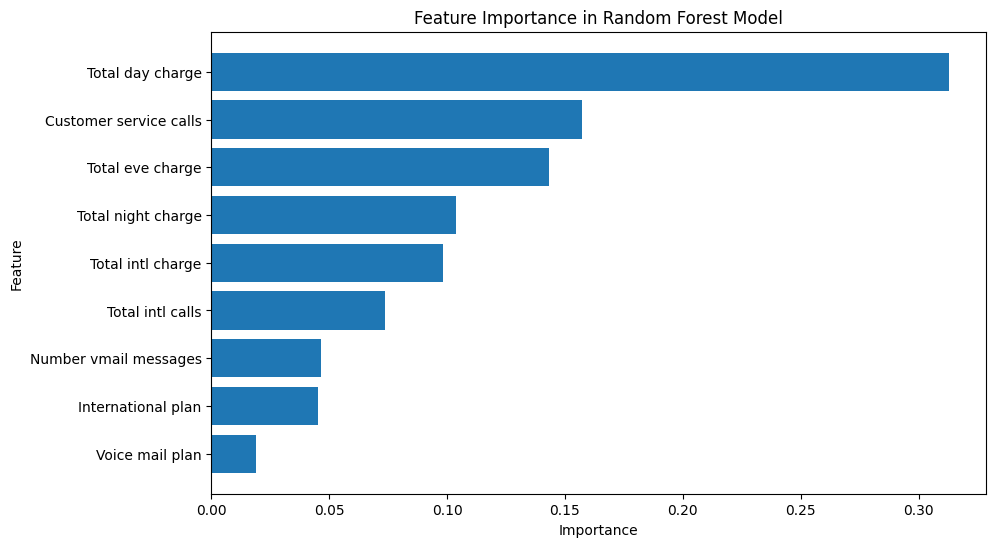

In [77]:
# Get feature importances
feature_importances = best_model.feature_importances_

# Create a DataFrame for visualization
features = X_train_combined.columns
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=True)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance in Random Forest Model')
plt.show()

To finish off with the most important features, that are affecting the likelihood of people churning such as Total day charge, customer service calls and international plan mainly, where these features make sense and can help us shift our attention to customers with high total day charge or have high frequency of customer service calls or international plans.

+ We can provide heavy users bundles or plans that are more suitable for their usage to help keep them from churning.
+ Take care of customers who frequently call customer service because they are likely to churn. And Improve the customer service experience overall.
+ Improve the international plan as it seems to cause people churn.